In [3]:
import pandas as pd

# Cargar de dataset preprocesado
file_path = "Beneficiarios Fonasa 2023.csv"
df = pd.read_csv(file_path, encoding="latin1")

In [5]:
print(df.head())


   MES_INFORMACION  CÓDIGO_BENEFICIARIO    SEXO    EDAD_TRAMO TITULAR_CARGA  \
0           202312             71819187  Hombre  40 a 49 años       Titular   
1           202312             80064014  Hombre  40 a 49 años       Titular   
2           202312             87503153   Mujer  50 a 59 años       Titular   
3           202312             71657668   Mujer  40 a 49 años       Titular   
4           202312             75628648   Mujer  40 a 49 años       Titular   

  TRAMO_FONASA        TRAMO_RENTA NACIONALIDAD      CARACTERIZACIÓN  \
0            D  650.001 - 700.000      Chilena          Dependiente   
1            D  900.001 - 950.000      Chilena          Dependiente   
2            A   Sin Cotizaciones      Chilena  Grupo Hogar Carente   
3            A   Sin Cotizaciones      Chilena                  Suf   
4            B        1 - 100.000      Chilena           Pensionado   

           TIPO_ASEGURADO REGIÓN_BENEFICIARIO COMUNA_BENEFICIARIO  
0  Trabajador Dependiente     

In [7]:
print(df.count())

MES_INFORMACION        16229898
CÓDIGO_BENEFICIARIO    16229898
SEXO                   16229898
EDAD_TRAMO             16229898
TITULAR_CARGA          16229898
TRAMO_FONASA           16229898
TRAMO_RENTA            16229898
NACIONALIDAD           16229898
CARACTERIZACIÓN        16229898
TIPO_ASEGURADO         16229898
REGIÓN_BENEFICIARIO    16229898
COMUNA_BENEFICIARIO    16229898
dtype: int64


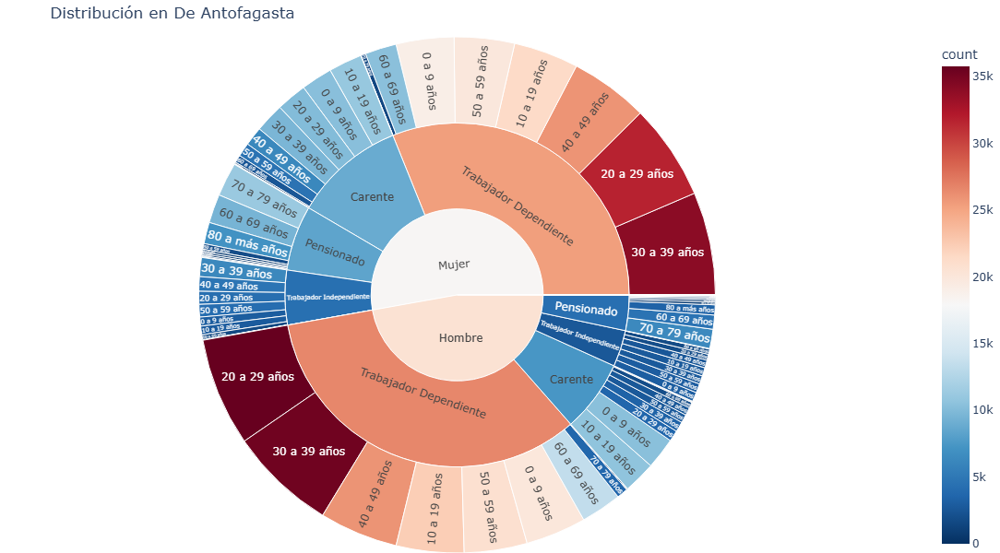

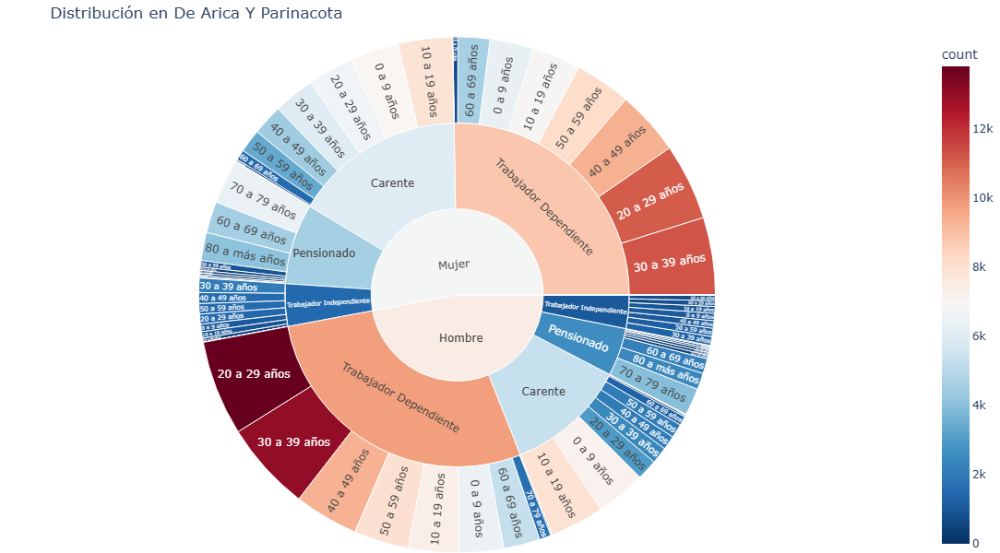

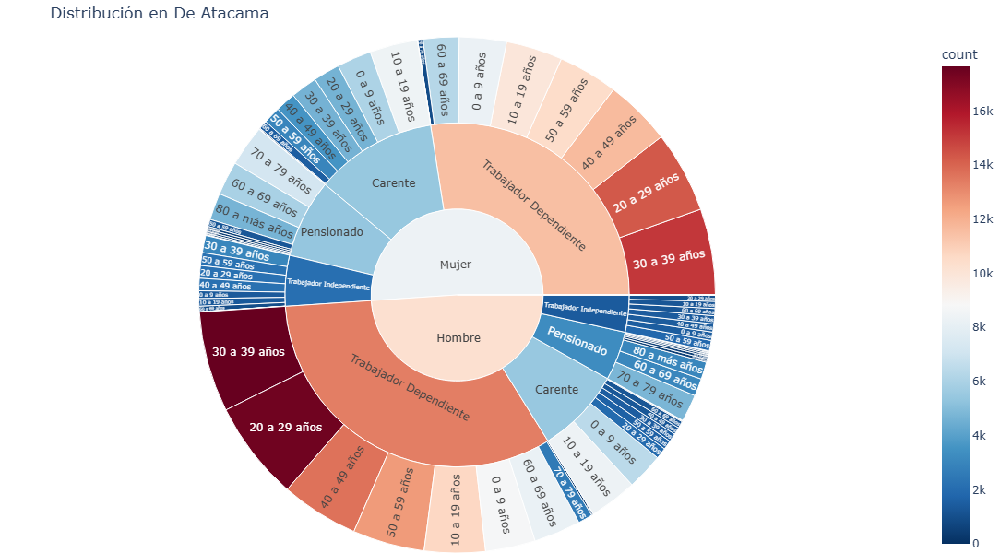

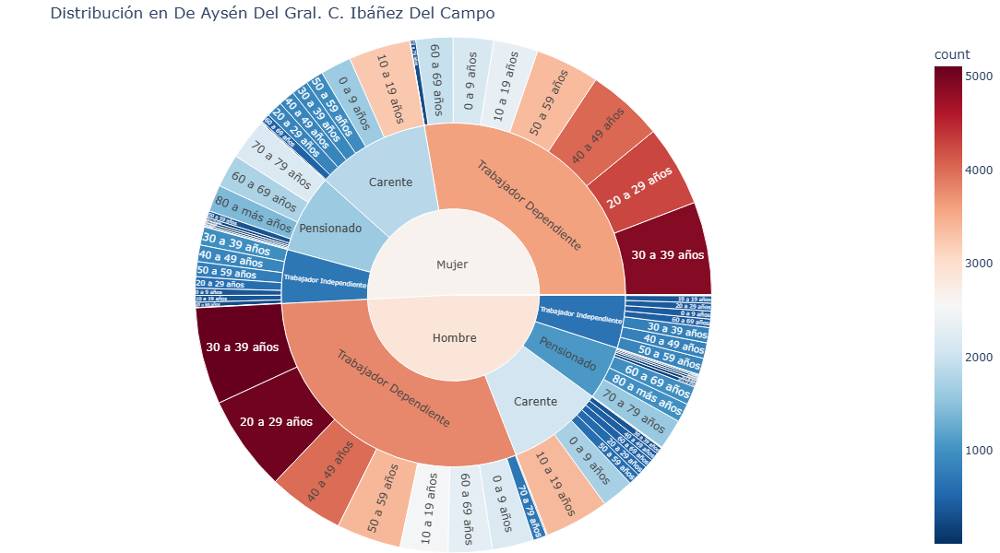

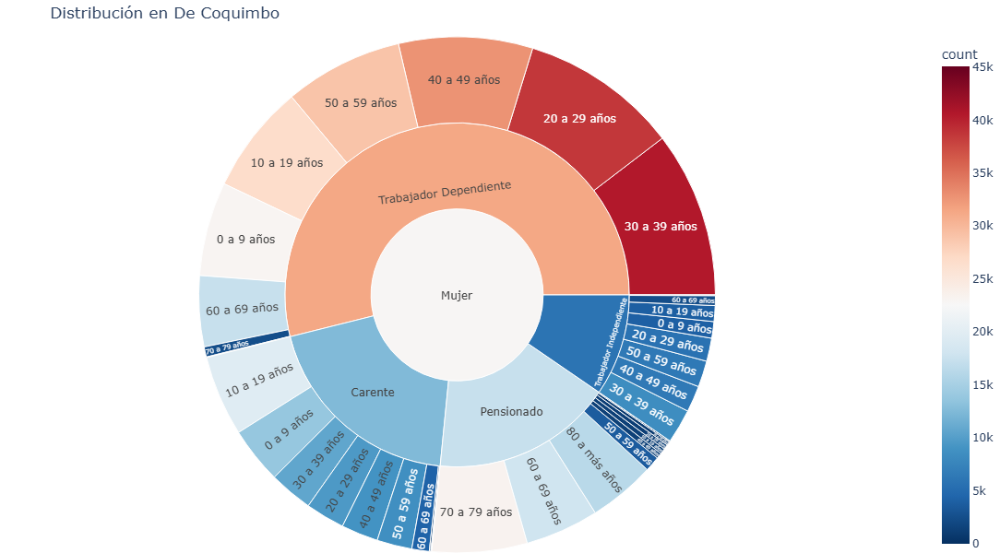

...

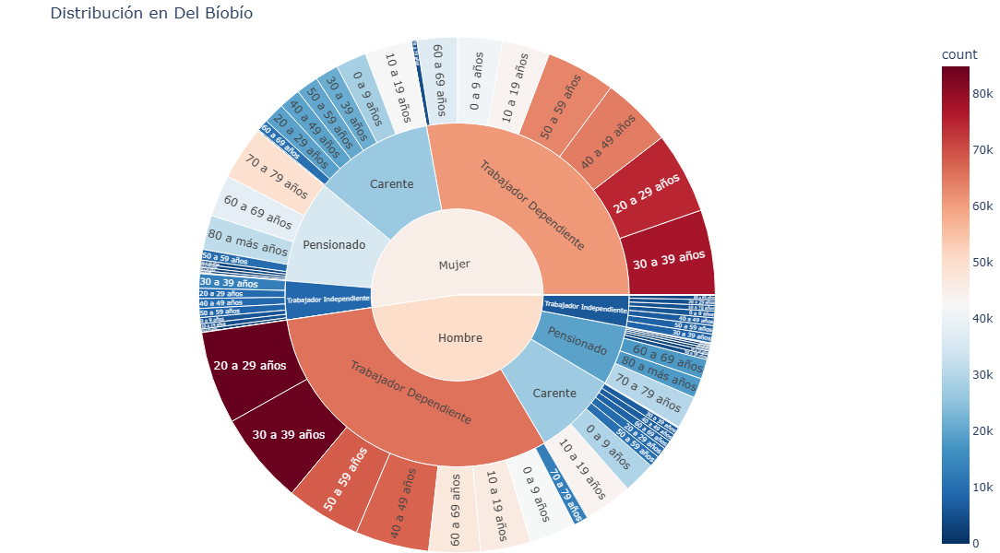

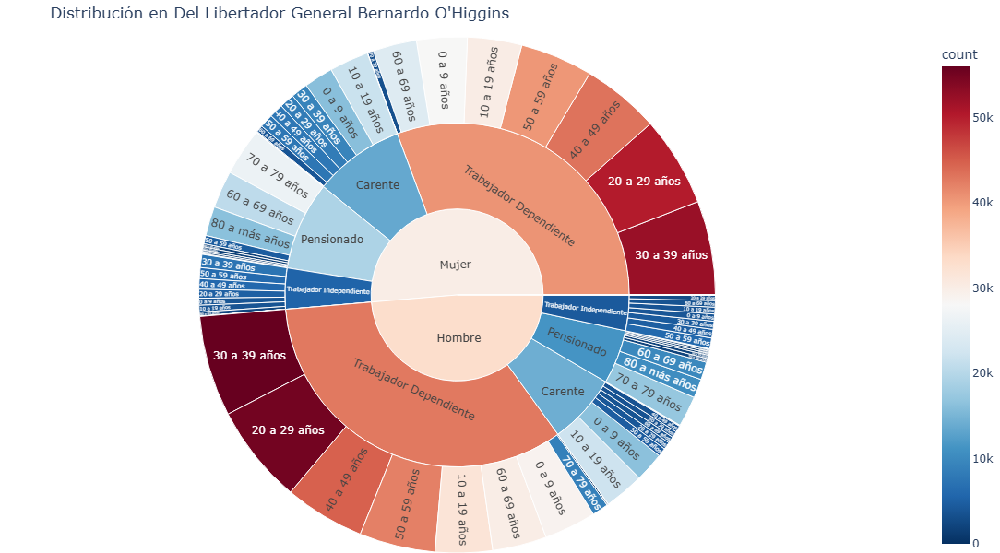

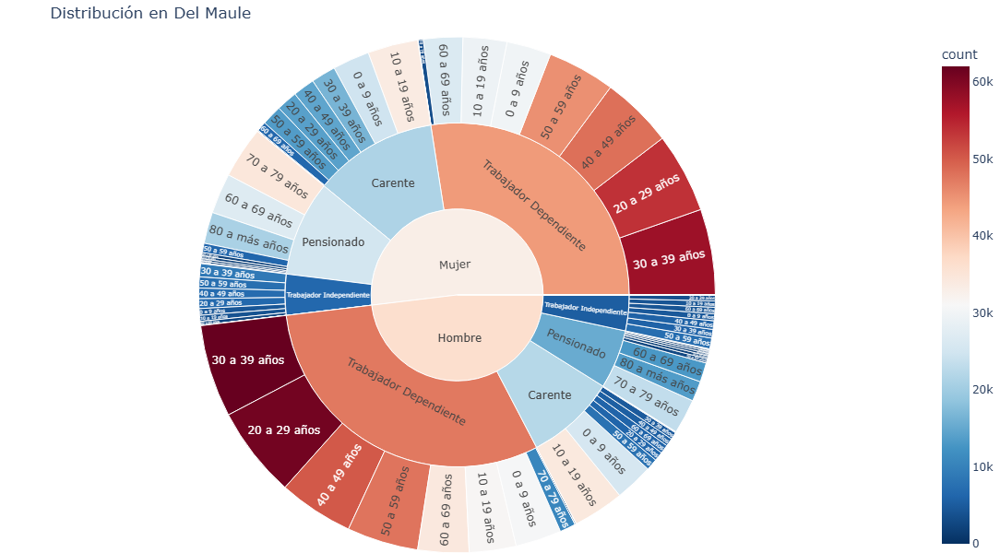

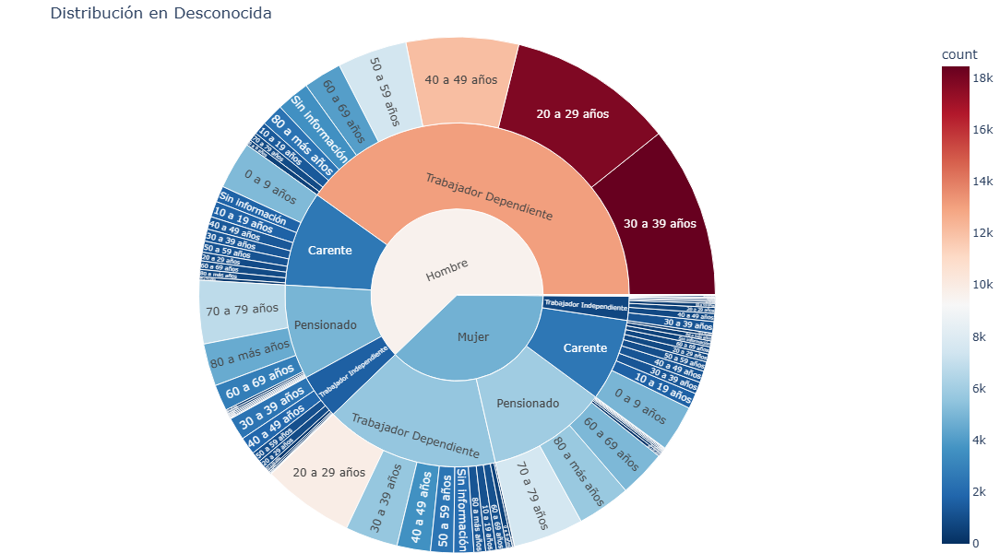

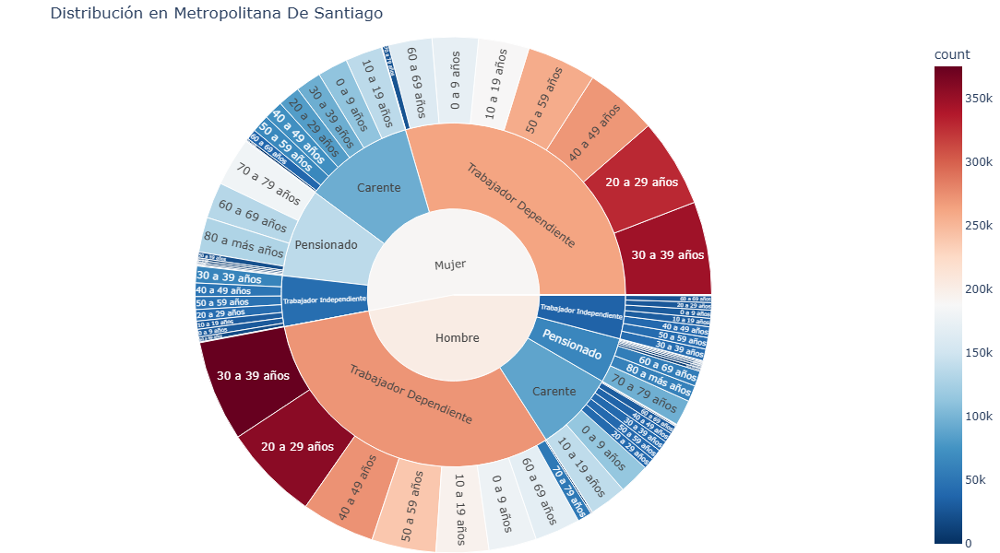

In [11]:
import plotly.express as px

# Agrupar por las categorías seleccionadas y contar registros
df_grouped = df.groupby(['REGIÓN_BENEFICIARIO', 'SEXO', 'TIPO_ASEGURADO', 'EDAD_TRAMO']).size().reset_index(name='count')

# Obtener lista única de regiones
regiones = df_grouped['REGIÓN_BENEFICIARIO'].unique()

# Generar un gráfico separado por cada región
for region in regiones:
    df_region = df_grouped[df_grouped['REGIÓN_BENEFICIARIO'] == region]

    fig = px.sunburst(df_region, path=['SEXO', 'TIPO_ASEGURADO', 'EDAD_TRAMO'],
                      values='count',  
                      color='count',  
                      color_continuous_scale='rdbu_r',
                      width=960, height=600,
                      title=f"Distribución en {region}"
                     )

    fig.update_layout(margin=dict(t=40, l=0, r=0, b=0))
    
    # Mostrar el gráfico de la región actual
    fig.show()



In [21]:
# Crear la tabla de contingencia
contingency_table = pd.crosstab(df['REGIÓN_BENEFICIARIO'], df['SEXO'])

# Mostrar la tabla
print(contingency_table)

SEXO                                        Hombre    Mujer  Sin información
REGIÓN_BENEFICIARIO                                                         
De Antofagasta                              248934   278673               57
De Arica Y Parinacota                       109171   122867               22
De Atacama                                  137148   143105               17
De Aysén Del Gral. C. Ibáñez Del Campo       41360    42718                5
De Coquimbo                                 359896   390573               16
De La Araucanía                             458810   499037               13
De Los Lagos                                404871   432333               17
De Los Ríos                                 182405   198422                0
De Magallanes Y De La Antártica Chilena      69160    75422                5
De Tarapacá                                 163214   176554               25
De Valparaíso                               796417   886816               38

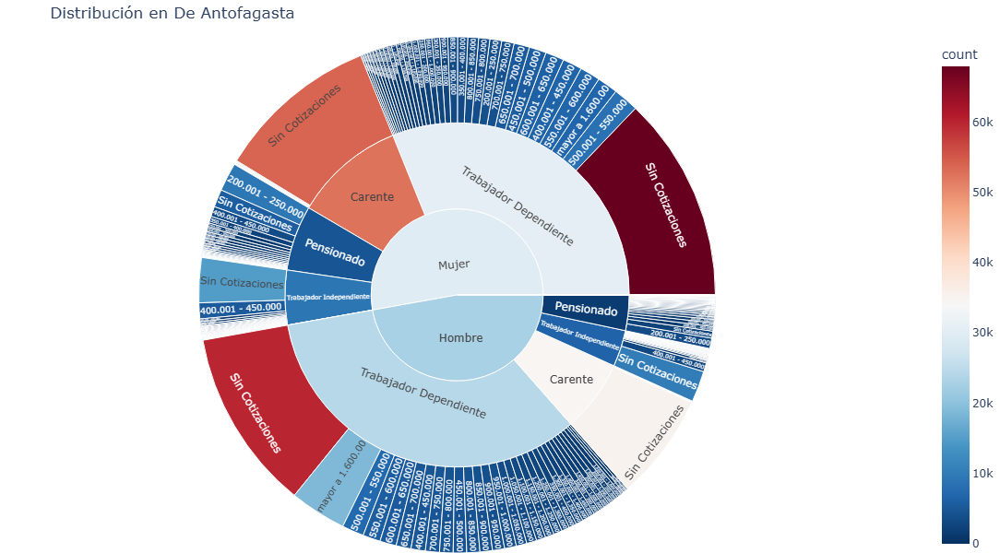

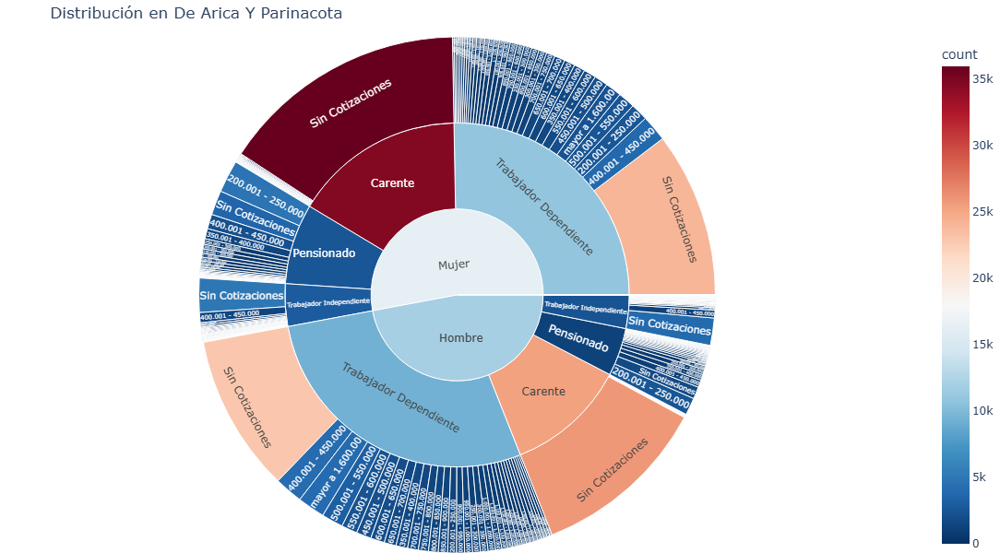

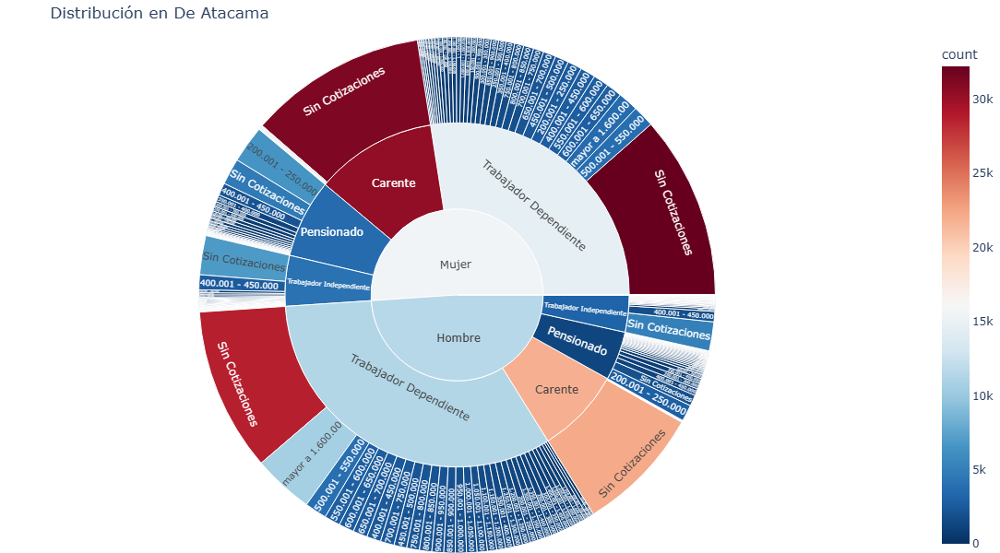

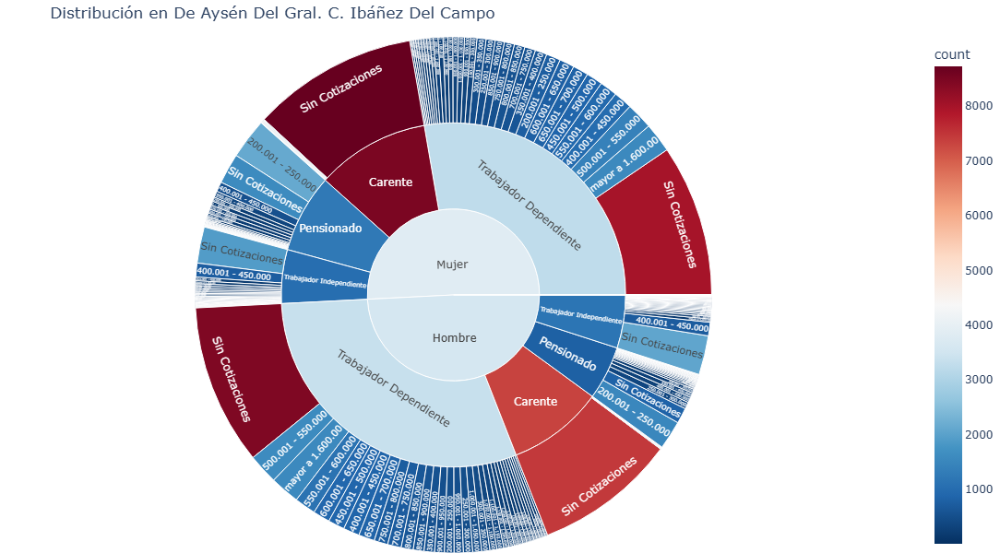

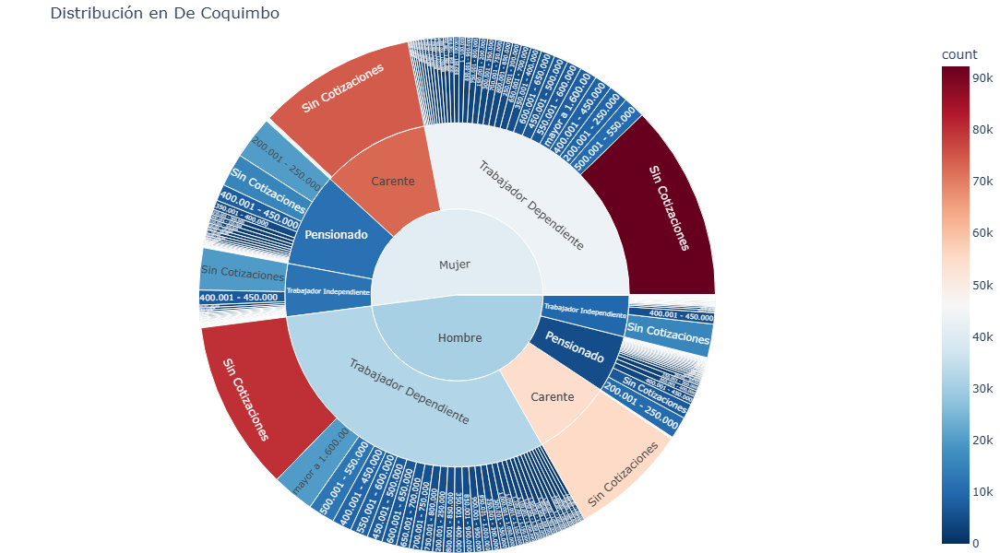

...

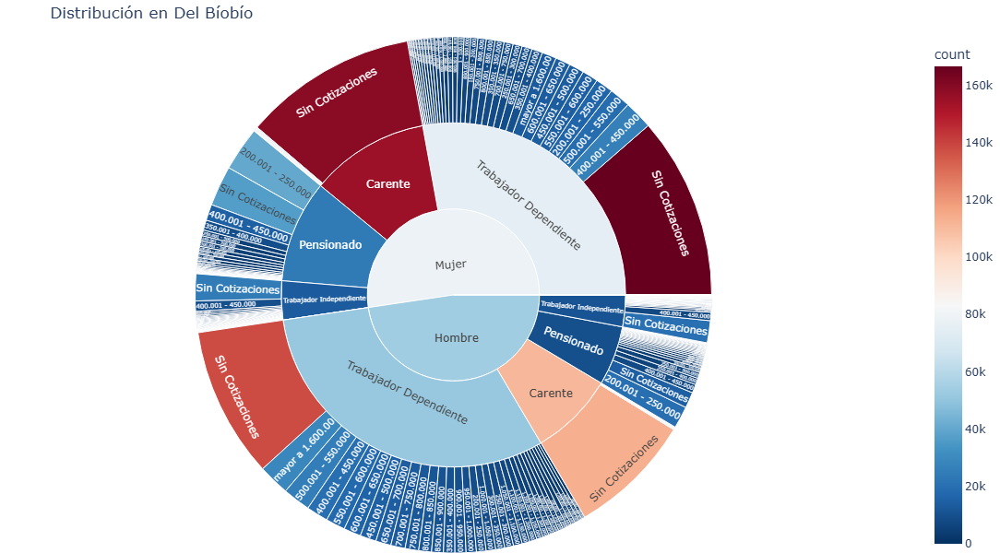

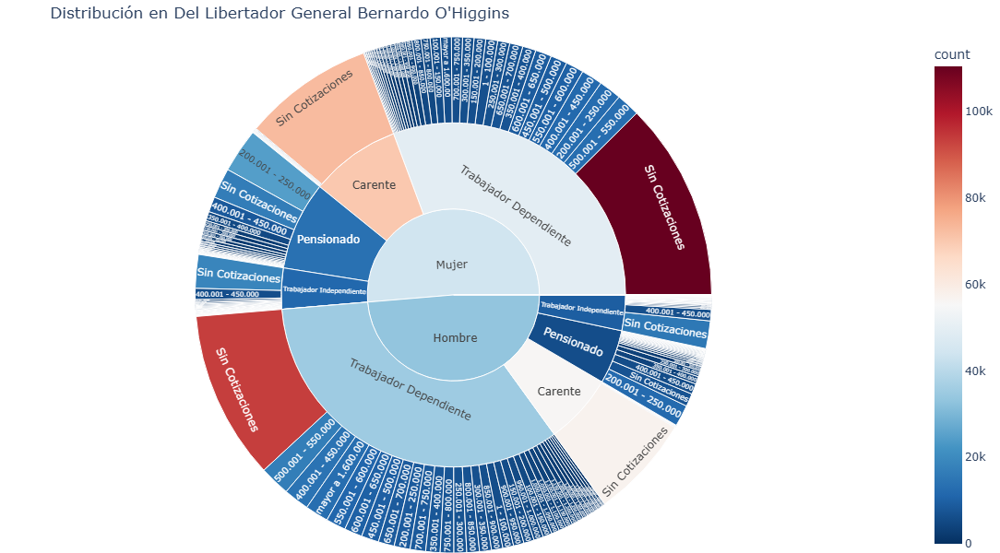

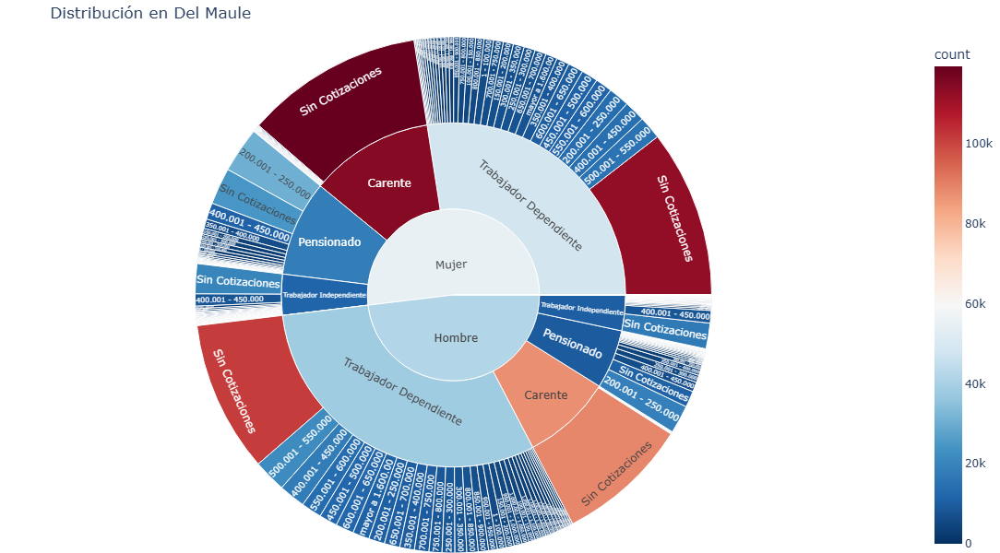

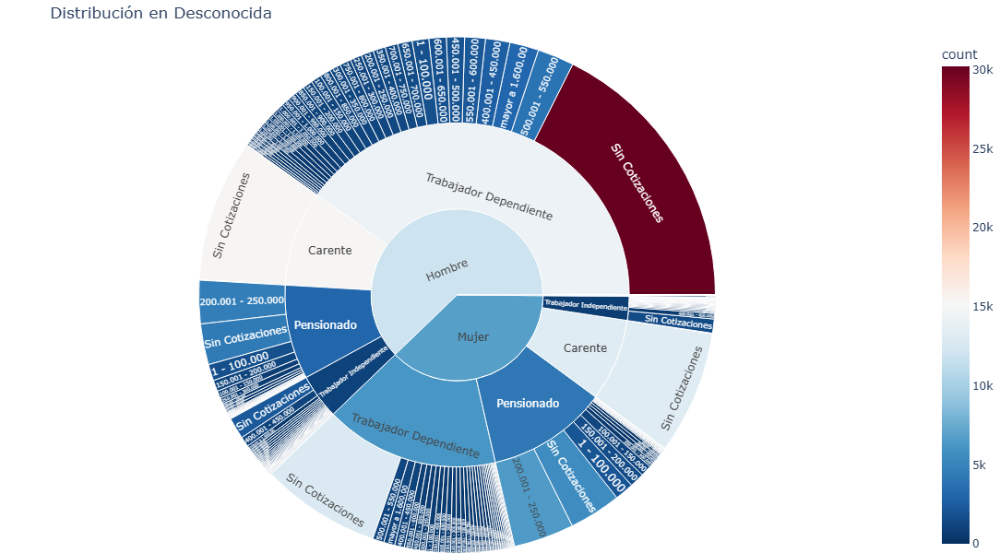

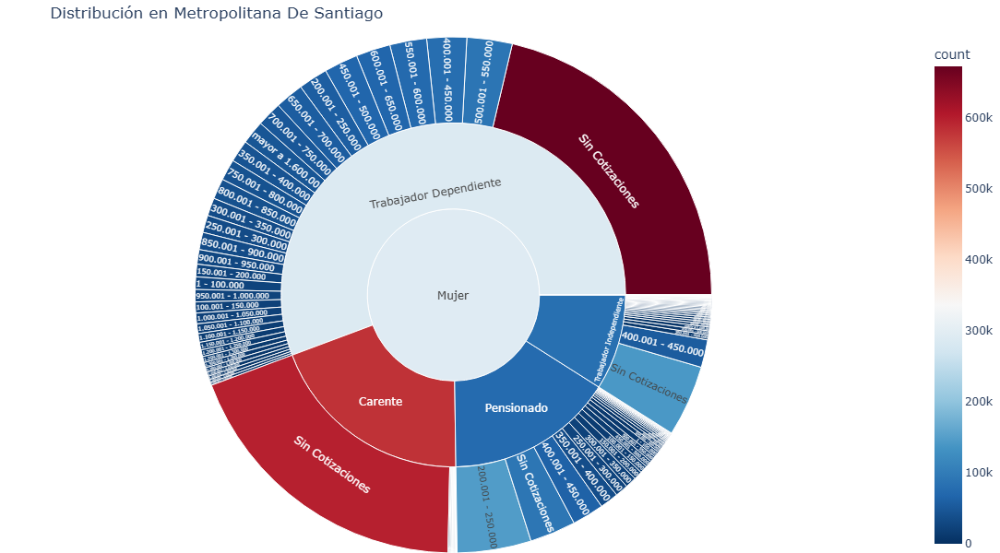

In [23]:
import plotly.express as px

# Agrupar por las categorías seleccionadas y contar registros
df_grouped = df.groupby(['REGIÓN_BENEFICIARIO', 'SEXO', 'TIPO_ASEGURADO', 'TRAMO_RENTA']).size().reset_index(name='count')

# Obtener lista única de regiones
regiones = df_grouped['REGIÓN_BENEFICIARIO'].unique()

# Generar un gráfico separado por cada región
for region in regiones:
    df_region = df_grouped[df_grouped['REGIÓN_BENEFICIARIO'] == region]

    fig = px.sunburst(df_region, path=['SEXO', 'TIPO_ASEGURADO', 'TRAMO_RENTA'],
                      values='count',  
                      color='count',  
                      color_continuous_scale='rdbu_r',
                      width=960, height=600,
                      title=f"Distribución en {region}"
                     )

    fig.update_layout(margin=dict(t=40, l=0, r=0, b=0))
    
    # Mostrar el gráfico de la región actual
    fig.show()


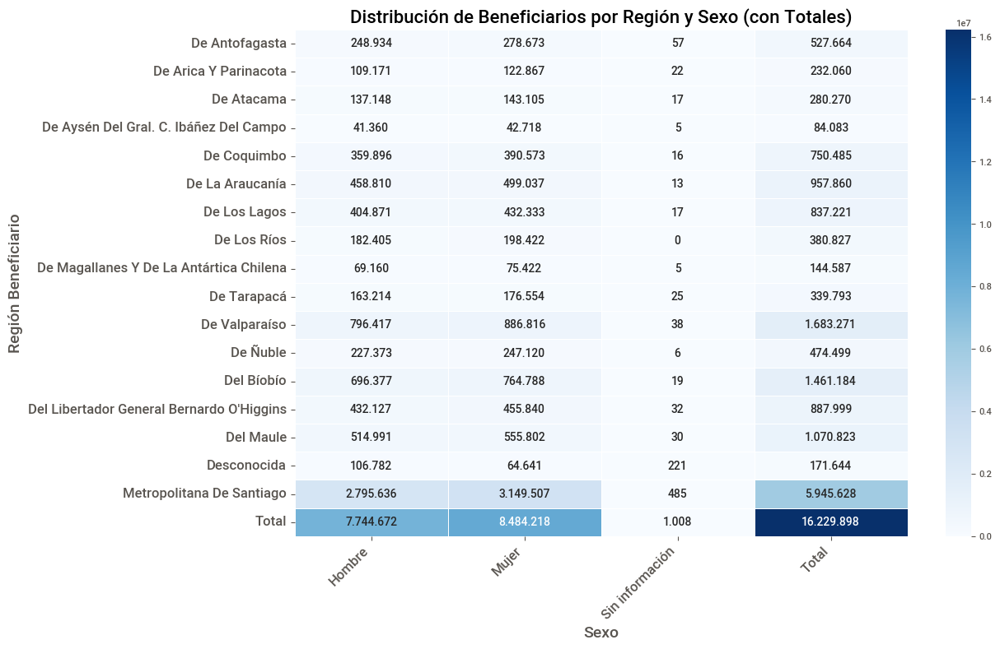

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Crear la tabla de contingencia
contingency_table = pd.crosstab(df['REGIÓN_BENEFICIARIO'], df['SEXO'])

# Agregar totales por fila y por columna
contingency_table['Total'] = contingency_table.sum(axis=1)  # Total por región
contingency_table.loc['Total'] = contingency_table.sum(axis=0)  # Total general

# Convertir los valores a formato con separador de miles
contingency_table_formatted = contingency_table.map(lambda x: f"{x:,}".replace(",", "."))

# Ajustar tamaño de figura
plt.figure(figsize=(12, 8))

# Crear heatmap con valores formateados
sns.heatmap(contingency_table, 
            annot=contingency_table_formatted, fmt="",  
            cmap="Blues", linewidths=0.5, 
            annot_kws={"size": 10})  

# Ajustar etiquetas
plt.xticks(rotation=45, ha="right", fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel("Sexo", fontsize=14)
plt.ylabel("Región Beneficiario", fontsize=14)
plt.title("Distribución de Beneficiarios por Región y Sexo (con Totales)", fontsize=16)

# Mostrar el gráfico
plt.show()


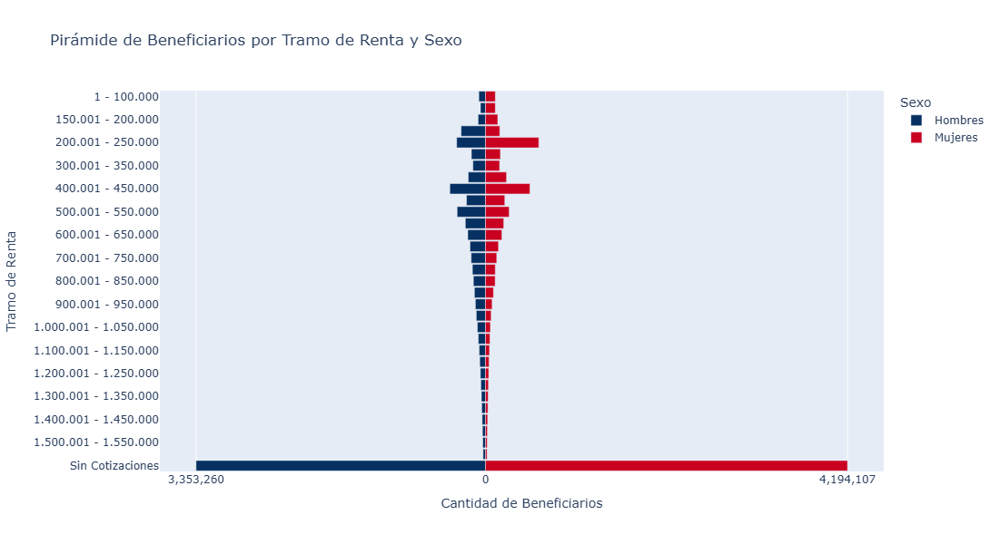

In [17]:
import plotly.graph_objects as go
import pandas as pd
import re

# Contar la cantidad de registros por TRAMO_RENTA y SEXO
tramo_renta_counts = df.groupby(['TRAMO_RENTA', 'SEXO']).size().reset_index(name='count')

# Función para extraer el número inicial del tramo de renta y convertirlo en entero
def extract_numeric_value(tramo):
    match = re.search(r'(\d+)', tramo.replace(".", ""))  # Extraer primer número y remover puntos
    return int(match.group(1)) if match else float('inf')  # Convertir a número, manejar errores

# Crear índice numérico basado en los valores de TRAMO_RENTA
tramo_renta_counts['orden'] = tramo_renta_counts['TRAMO_RENTA'].apply(extract_numeric_value)

# Ordenar correctamente los tramos de menor a mayor
tramo_renta_counts = tramo_renta_counts.sort_values(by='orden', ascending=True)

# Separar datos para hombres y mujeres
df_hombres = tramo_renta_counts[tramo_renta_counts['SEXO'] == 'Hombre']
df_mujeres = tramo_renta_counts[tramo_renta_counts['SEXO'] == 'Mujer']

# Reindexar para asegurar que ambos datasets tengan los mismos tramos
tramos_ordenados = tramo_renta_counts['TRAMO_RENTA'].unique()
df_hombres = df_hombres.set_index('TRAMO_RENTA').reindex(tramos_ordenados).fillna(0).reset_index()
df_mujeres = df_mujeres.set_index('TRAMO_RENTA').reindex(tramos_ordenados).fillna(0).reset_index()

# Crear gráfico de pirámide poblacional con colores rdbu_r
fig = go.Figure()

# Barras para hombres (lado izquierdo, azul oscuro)
fig.add_trace(go.Bar(y=df_hombres['TRAMO_RENTA'], 
                     x=-df_hombres['count'],  # Negativo para alinear a la izquierda
                     name='Hombres', 
                     orientation='h',
                     marker=dict(color='rgb(5, 48, 97)')))  # Azul oscuro

# Barras para mujeres (lado derecho, rojo suave)
fig.add_trace(go.Bar(y=df_mujeres['TRAMO_RENTA'], 
                     x=df_mujeres['count'], 
                     name='Mujeres', 
                     orientation='h',
                     marker=dict(color='rgb(202, 0, 32)')))  # Rojo fuerte

# Personalizar diseño
fig.update_layout(title="Pirámide de Beneficiarios por Tramo de Renta y Sexo",
                  barmode='relative', 
                  bargap=0.1,
                  xaxis=dict(title="Cantidad de Beneficiarios", 
                             tickvals=[-max(df_hombres['count']), 0, max(df_mujeres['count'])], 
                             ticktext=[f"{max(df_hombres['count']):,}", "0", f"{max(df_mujeres['count']):,}"]),
                  yaxis=dict(title="Tramo de Renta", categoryorder="array", categoryarray=tramos_ordenados[::-1]),  # Orden de menor a mayor
                  legend=dict(title="Sexo"),
                  width=900, height=600)

# Mostrar gráfico
fig.show()




In [19]:
import sweetviz as sv

report = sv.analyze(df)
report.show_html("sweetviz_report.html")

                                             |                                             | [  0%]   00:00 ->…

Report sweetviz_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.
